<a href="https://colab.research.google.com/github/eliud2108/Vision_IA/blob/main/autoencoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from PIL import Image
import cv2
from google.colab import drive




In [ ]:
import zipfile
import os

# Ruta donde está el .zip
zip_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets..zip'

# Ruta donde quieres descomprimirlo
extract_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets'

# Descomprimir solo si no se ha hecho antes
if not os.path.exists(extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Descompresión completa.")
else:
    print("Ya está descomprimido.")


Ya está descomprimido.


In [ ]:
# Ruta base después de descomprimir
base_path = '/content/SAR_datasets/SAR despeckling filters dataset/Main folder'

# Definir rutas correctas
noisy_train_path = os.path.join(base_path, 'Noisy')
clean_train_path = os.path.join(base_path, 'GTruth')

noisy_val_path = os.path.join(base_path, 'Noisy_val')
clean_val_path = os.path.join(base_path, 'GTruth_val')


In [ ]:
# Rutas corregidas después de comprobar
noisy_train_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets/SAR despeckling filters dataset/Main folder/Noisy'
clean_train_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets/SAR despeckling filters dataset/Main folder/GTruth'

noisy_val_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets/SAR despeckling filters dataset/Main folder/Noisy_val'
clean_val_path = '/content/drive/MyDrive/VISION_con_IA/G_4_Apre_prof/SAR_datasets/SAR despeckling filters dataset/Main folder/GTruth_val'


In [ ]:
# Parámetros
img_height, img_width = 512, 512  # Según el artículo
batch_size = 4  # Reducido debido a limitaciones de memoria en Colab
n_samples = 300  # Seleccionar solo una parte del dataset para evitar problemas de memoria

# Función para cargar y preparar imágenes
def cargar_imagenes(ruta_ruidosa, ruta_limpia, cantidad=None, limite_inicio=0):
    """
    Carga y prepara las imágenes de las rutas especificadas.

    Args:
        ruta_ruidosa: Ruta de las imágenes con ruido
        ruta_limpia: Ruta de las imágenes de referencia (ground truth)
        cantidad: Número de imágenes a cargar (None para todas)
        limite_inicio: Índice de inicio para carga de datos

    Returns:
        Tupla de arreglos (imágenes ruidosas, imágenes limpias)
    """
    nombres_archivos = sorted(os.listdir(ruta_ruidosa))

    if cantidad is not None:
        nombres_archivos = nombres_archivos[limite_inicio:limite_inicio + cantidad]

    imagenes_ruidosas = []
    imagenes_limpias = []

    for nombre in nombres_archivos:
        # Cargar imagen ruidosa
        ruta_img_ruidosa = os.path.join(ruta_ruidosa, nombre)
        img_ruidosa = np.array(Image.open(ruta_img_ruidosa))

        # Normalizar a [0, 1]
        img_ruidosa = img_ruidosa / 255.0

        # Cargar imagen limpia correspondiente
        ruta_img_limpia = os.path.join(ruta_limpia, nombre)
        img_limpia = np.array(Image.open(ruta_img_limpia))
        img_limpia = img_limpia / 255.0

        imagenes_ruidosas.append(img_ruidosa)
        imagenes_limpias.append(img_limpia)

    # Convertir a arrays de numpy y añadir dimensión del canal
    x = np.array(imagenes_ruidosas).reshape(-1, img_height, img_width, 1)
    y = np.array(imagenes_limpias).reshape(-1, img_height, img_width, 1)

    return x, y

In [ ]:
# Cargar un subconjunto de imágenes de entrenamiento
x_train, y_train = cargar_imagenes(noisy_train_path, clean_train_path, n_samples)
x_val, y_val = cargar_imagenes(noisy_val_path, clean_val_path, 50)  # Cargar solo 50 imágenes para validación

print(f"Datos de entrenamiento cargados: {x_train.shape}")
print(f"Datos de validación cargados: {x_val.shape}")

Datos de entrenamiento cargados: (900, 512, 512, 1)
Datos de validación cargados: (150, 512, 512, 1)


In [ ]:
# Construir el modelo de Autoencoder según el artículo
def crear_autoencoder():
    """
    Crea el modelo de autoencoder según la estructura descrita en el artículo
    """
    # Input
    entrada = Input(shape=(img_height, img_width, 1))

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(entrada)
    x = MaxPooling2D((2, 2), padding='same')(x)  # 256x256
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)  # 128x128

    # Latent layer (bottleneck)
    # La imagen se ha comprimido a 128x128

    # Decoder
    x = Conv2DTranspose(32, (3, 3), strides=2, activation='relu', padding='same')(x)  # 256x256
    x = Conv2DTranspose(32, (3, 3), strides=2, activation='relu', padding='same')(x)  # 512x512

    # Output
    salida = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Crear modelo
    modelo = Model(inputs=entrada, outputs=salida)

    # Compilar modelo con Binary Cross-Entropy (BCE) como en el artículo
    modelo.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy')

    return modelo

# Crear el modelo
autoencoder = crear_autoencoder()
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 512, 512, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 512, 512, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 256, 256, 32)   │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 512, 512, 32)   │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 512, 512, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,353 (110.75 KB)

 Trainable params: 28,353 (110.75 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Callbacks para mejorar el entrenamiento
checkpoint = ModelCheckpoint('mejor_modelo.keras', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001, verbose=1)

# Entrenar el modelo
history = autoencoder.fit(
    x_train, y_train,
    epochs=10,  # Reducido para evitar problemas de recursos
    batch_size=batch_size,
    validation_data=(x_val, y_val),
    callbacks=[checkpoint, early_stopping, reduce_lr],
    verbose=1
)

Epoch 1/10
224/225 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.6252
Epoch 1: val_loss improved from inf to 0.63880, saving model to mejor_modelo.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.6250 - val_loss: 0.6388 - learning_rate: 0.0010
Epoch 2/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5660
Epoch 2: val_loss improved from 0.63880 to 0.61994, saving model to mejor_modelo.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - loss: 0.5660 - val_loss: 0.6199 - learning_rate: 0.0010
Epoch 3/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.5574
Epoch 3: val_loss improved from 0.61994 to 0.61804, saving model to mejor_modelo.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - loss: 0.5574 - val_loss: 0.6180 - learning_rate: 0.0010
Epoch 4/10
224/225 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5558
Epoch 4: val_loss improved from 0.61804 to 0.61737, saving model to mejor_modelo.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - loss: 0.5559 - val_loss: 0.6174 - le

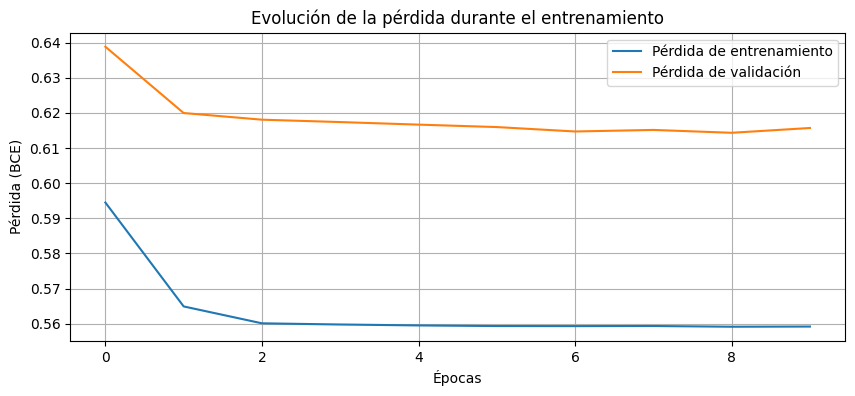

In [ ]:
# Visualizar la pérdida durante el entrenamiento
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Pérdida de entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de validación')
plt.title('Evolución de la pérdida durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('Pérdida (BCE)')
plt.legend()
plt.grid(True)
plt.savefig('loss_history.png')
plt.show()

In [ ]:
# Función para calcular ENL (Equivalent Number of Looks)
def calcular_enl(imagen, ventana_tamanio=20):
    """
    Calcula el ENL (Equivalent Number of Looks) en una región homogénea de la imagen.

    Args:
        imagen: Imagen de entrada
        ventana_tamanio: Tamaño de la ventana para calcular el ENL

    Returns:
        ENL calculado
    """
    # Tomar una ventana central para el cálculo
    h, w = imagen.shape[:2]
    x_start = h // 2 - ventana_tamanio // 2
    y_start = w // 2 - ventana_tamanio // 2

    # Extraer la ventana
    ventana = imagen[x_start:x_start + ventana_tamanio, y_start:y_start + ventana_tamanio]

    # Calcular ENL = (media)^2 / varianza
    media = np.mean(ventana)
    varianza = np.var(ventana)

    if varianza == 0:  # Evitar división por cero
        return float('inf')

    enl = (media ** 2) / varianza
    return enl

In [ ]:
# Función para calcular M-estimator como se menciona en el artículo
def calcular_m_estimator(imagen_original, imagen_filtrada):
    """
    Calcula el estimador M para una imagen filtrada

    Args:
        imagen_original: Imagen original con ruido
        imagen_filtrada: Imagen después del filtrado

    Returns:
        Valor del estimador M
    """
    # Asegurar que no haya divisiones por cero
    epsilon = 1e-10
    imagen_original = np.maximum(imagen_original, epsilon)
    imagen_filtrada = np.maximum(imagen_filtrada, epsilon)

    # Calcular la imagen ratio
    ratio = imagen_original / imagen_filtrada

    # Calcular estadísticas
    mu = np.mean(ratio)
    sigma = np.std(ratio)

    # M-estimator según artículo (desviación de la media teórica 1.0 y desviación estándar teórica)
    # Un filtro perfecto dará M = 0
    m = abs(mu - 1.0) + abs(sigma - (1.0 / np.sqrt(1.0)))

    return m

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Imagen 1:
  ENL (original): inf
  ENL (filtrada): 29.8972
  PSNR: 27.7306
  SSIM: 0.8386
  M-estimator: 1.5928
-----
Imagen 2:
  ENL (original): inf
  ENL (filtrada): 29.8972
  PSNR: 28.2217
  SSIM: 0.8359
  M-estimator: 1.5866
-----
Imagen 3:
  ENL (original): inf
  ENL (filtrada): 29.8972
  PSNR: 27.8868
  SSIM: 0.8345
  M-estimator: 1.5900
-----
Imagen 4:
  ENL (original): 12.5650
  ENL (filtrada): 35.6593
  PSNR: 24.8175
  SSIM: 0.6784
  M-estimator: 0.9069
-----
Imagen 5:
  ENL (original): 22.0623
  ENL (filtrada): 67.7577
  PSNR: 24.7769
  SSIM: 0.6429
  M-estimator: 0.9128
-----
Imagen 6:
  ENL (original): 16.1043
  ENL (filtrada): 63.5643
  PSNR: 24.7475
  SSIM: 0.6796
  M-estimator: 0.9109
-----
Imagen 7:
  ENL (original): 4.1255
  ENL (filtrada): 7.2864
  PSNR: 18.9998
  SSIM: 0.7971
  M-estimator: 0.9005
-----
Imagen 8:
  ENL (original): 8.9323
  ENL (filtrada): 24.9188
  PSNR: 21.4124
  SSIM: 0.7628
  M-estimator: 0.8841
-----
Imagen 9:
 

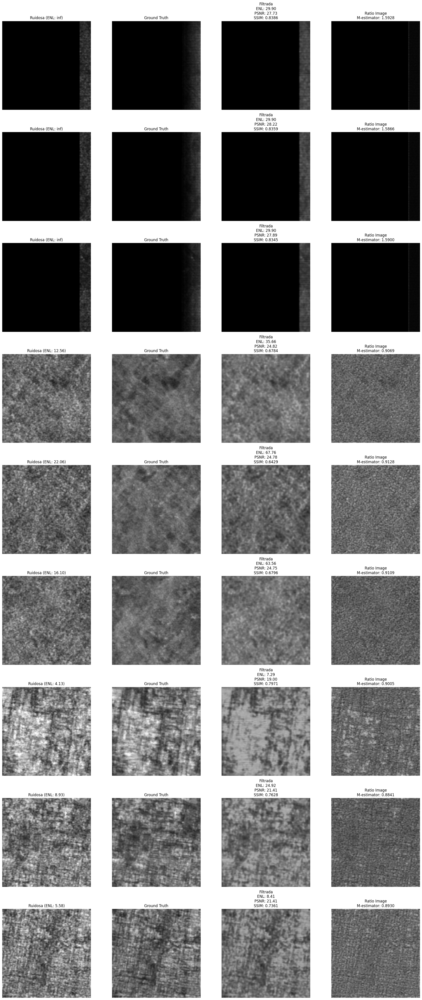

In [ ]:


# Evaluar el modelo en imágenes de validación
def evaluar_modelo(modelo, x_val, y_val, num_imagenes=9):
    """
    Evalúa el modelo y muestra resultados visuales y métricas

    Args:
        modelo: Modelo entrenado
        x_val: Imágenes de validación con ruido
        y_val: Imágenes ground truth
        num_imagenes: Número de imágenes a mostrar
    """
    # Predecir con el modelo
    predicciones = modelo.predict(x_val[:num_imagenes])

    # Configurar el tamaño de la figura
    plt.figure(figsize=(20, 5 * num_imagenes))

    for i in range(num_imagenes):
        # Imagen original con ruido
        img_ruidosa = x_val[i].reshape(img_height, img_width)

        # Imagen ground truth
        img_ground_truth = y_val[i].reshape(img_height, img_width)

        # Imagen filtrada
        img_filtrada = predicciones[i].reshape(img_height, img_width)

        # Imagen ratio (para el M-estimator)
        epsilon = 1e-10
        img_ratio = img_ruidosa / (img_filtrada + epsilon)

        img_ground_truth = img_ground_truth.astype('float32')
        img_filtrada = img_filtrada.astype('float32')


        # Calcular métricas
        psnr_valor = psnr(img_ground_truth, img_filtrada, data_range=1.0)
        ssim_valor = ssim(img_ground_truth, img_filtrada, data_range=1.0)

        enl_original = calcular_enl(img_ruidosa)
        enl_filtrada = calcular_enl(img_filtrada)
        m_estimator = calcular_m_estimator(img_ruidosa, img_filtrada)

        # Mostrar las imágenes
        plt.subplot(num_imagenes, 4, i*4 + 1)
        plt.imshow(img_ruidosa, cmap='gray')
        plt.title(f'Ruidosa (ENL: {enl_original:.2f})')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 2)
        plt.imshow(img_ground_truth, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 3)
        plt.imshow(img_filtrada, cmap='gray')
        plt.title(f'Filtrada\nENL: {enl_filtrada:.2f}\nPSNR: {psnr_valor:.2f}\nSSIM: {ssim_valor:.4f}')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 4)
        plt.imshow(img_ratio, cmap='gray')
        plt.title(f'Ratio Image\nM-estimator: {m_estimator:.4f}')
        plt.axis('off')

        # Imprimir métricas
        print(f"Imagen {i+1}:")
        print(f"  ENL (original): {enl_original:.4f}")
        print(f"  ENL (filtrada): {enl_filtrada:.4f}")
        print(f"  PSNR: {psnr_valor:.4f}")
        print(f"  SSIM: {ssim_valor:.4f}")
        print(f"  M-estimator: {m_estimator:.4f}")
        print("-----")

    plt.tight_layout()
    plt.savefig('resultados_evaluacion.png')
    plt.show()

# Evaluar el modelo
evaluar_modelo(autoencoder, x_val, y_val, num_imagenes=9)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


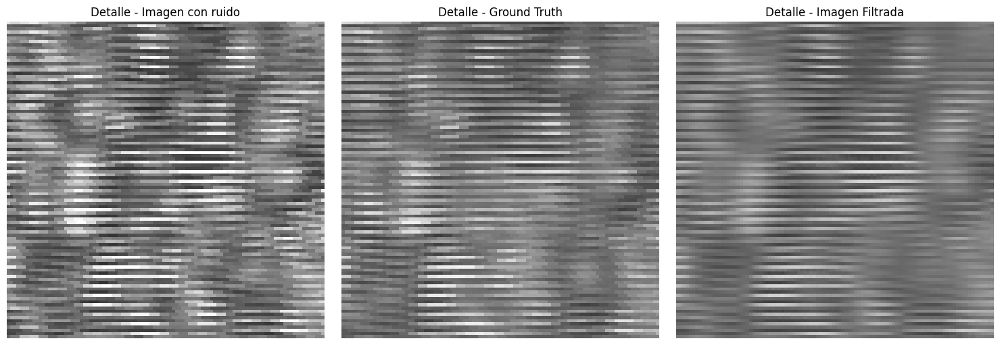

Métricas para la región de detalle:
  PSNR: 22.7629
  SSIM: 0.7739


In [ ]:
# Función para análisis detallado en un área específica
def analizar_detalle(modelo, imagen_ruidosa, imagen_gt, x_start, y_start, tamanio=100):
    """
    Analiza detalles específicos en una región de la imagen.

    Args:
        modelo: Modelo entrenado
        imagen_ruidosa: Imagen con ruido
        imagen_gt: Imagen ground truth
        x_start, y_start: Coordenadas iniciales de la región
        tamanio: Tamaño de la región a analizar
    """
    # Preparar imagen para el modelo
    img_input = imagen_ruidosa.reshape(1, img_height, img_width, 1)

    # Predecir
    img_filtrada = modelo.predict(img_input)[0].reshape(img_height, img_width)

    # Extraer regiones de interés
    roi_ruidosa = imagen_ruidosa[x_start:x_start + tamanio, y_start:y_start + tamanio]
    roi_gt = imagen_gt[x_start:x_start + tamanio, y_start:y_start + tamanio]
    roi_filtrada = img_filtrada[x_start:x_start + tamanio, y_start:y_start + tamanio]

    # Visualizar
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(roi_ruidosa, cmap='gray',vmin=0, vmax=1,interpolation='none')
    plt.title('Detalle - Imagen con ruido')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(roi_gt, cmap='gray',vmin=0, vmax=1,interpolation='none')
    plt.title('Detalle - Ground Truth')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(roi_filtrada, cmap='gray', vmin=0, vmax=1,interpolation='none')
    plt.title('Detalle - Imagen Filtrada')
    plt.axis('off')

    plt.tight_layout()
    plt.savefig('analisis_detalle.png')
    plt.show()



    # Calcular métricas para la región
    psnr_valor = psnr(roi_gt.astype('float32'), roi_filtrada.astype('float32'), data_range=1.0)
    ssim_valor = ssim(roi_gt.astype('float32'), roi_filtrada.astype('float32'), data_range=1.0)


    print(f"Métricas para la región de detalle:")
    print(f"  PSNR: {psnr_valor:.4f}")
    print(f"  SSIM: {ssim_valor:.4f}")

# Analizar un detalle específico en la primera imagen de validación
idx_imagen = 8
analizar_detalle(
    autoencoder,
    x_val[idx_imagen].reshape(img_height, img_width),
    y_val[idx_imagen].reshape(img_height, img_width),
    x_start=200, y_start=200, tamanio=100
)

In [ ]:
# Modificar el autoencoder para mejorar resultados
def crear_autoencoder_mejorado():
    """
    Crea una versión mejorada del autoencoder con más filtros y capas
    """
    # Input
    entrada = Input(shape=(img_height, img_width, 1))

    # Encoder con más filtros
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(entrada)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)  # 256x256

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)  # 128x128

    # Latent layer (bottleneck)
    # La imagen se ha comprimido a 128x128 con más filtros

    # Decoder
    x = Conv2DTranspose(128, (3, 3), strides=2, activation='relu', padding='same')(x)  # 256x256
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    x = Conv2DTranspose(64, (3, 3), strides=2, activation='relu', padding='same')(x)  # 512x512
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

    # Output con una capa adicional para refinamiento
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    salida = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Crear modelo
    modelo = Model(inputs=entrada, outputs=salida)

    # Compilar modelo con Binary Cross-Entropy como en el artículo
    # Usar una tasa de aprendizaje menor para un entrenamiento más estable
    modelo.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy')

    return modelo

# Crear el modelo mejorado
autoencoder_mejorado = crear_autoencoder_mejorado()
autoencoder_mejorado.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 512, 512, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 512, 512, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 512, 512, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 256, 256, 128)  │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 512, 512, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 512, 512, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 512, 512, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 512, 512, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 683,649 (2.61 MB)

 Trainable params: 683,649 (2.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entrenar el modelo mejorado
history_mejorado = autoencoder_mejorado.fit(
    x_train, y_train,
    epochs=30,  # Reducido para evitar problemas de recursos
    batch_size=batch_size,
    validation_data=(x_val, y_val),
    callbacks=[checkpoint, early_stopping, reduce_lr],
    verbose=1
)

Epoch 1/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step - loss: 0.5669
Epoch 1: val_loss did not improve from 0.61432
225/225 ━━━━━━━━━━━━━━━━━━━━ 83s 366ms/step - loss: 0.5669 - val_loss: 0.6325 - learning_rate: 5.0000e-04
Epoch 2/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step - loss: 0.5675
Epoch 2: val_loss did not improve from 0.61432
225/225 ━━━━━━━━━━━━━━━━━━━━ 142s 367ms/step - loss: 0.5675 - val_loss: 0.6317 - learning_rate: 5.0000e-04
Epoch 3/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - loss: 0.5694
Epoch 3: val_loss did not improve from 0.61432
225/225 ━━━━━━━━━━━━━━━━━━━━ 141s 361ms/step - loss: 0.5694 - val_loss: 0.6318 - learning_rate: 5.0000e-04
Epoch 4/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - loss: 0.5612
Epoch 4: val_loss did not improve from 0.61432
225/225 ━━━━━━━━━━━━━━━━━━━━ 81s 359ms/step - loss: 0.5612 - val_loss: 0.6302 - learning_rate: 5.0000e-04
Epoch 5/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step - loss: 0.5675
Epoch 5: val_loss did not improve from 0.

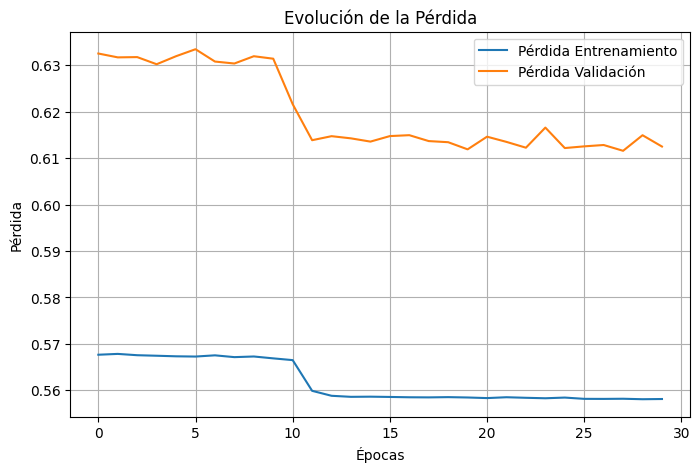

In [ ]:
import matplotlib.pyplot as plt

# Graficar pérdida (loss)
plt.figure(figsize=(8, 5))
plt.plot(history_mejorado.history['loss'], label='Pérdida Entrenamiento')
plt.plot(history_mejorado.history['val_loss'], label='Pérdida Validación')
plt.title('Evolución de la Pérdida')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.grid(True)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


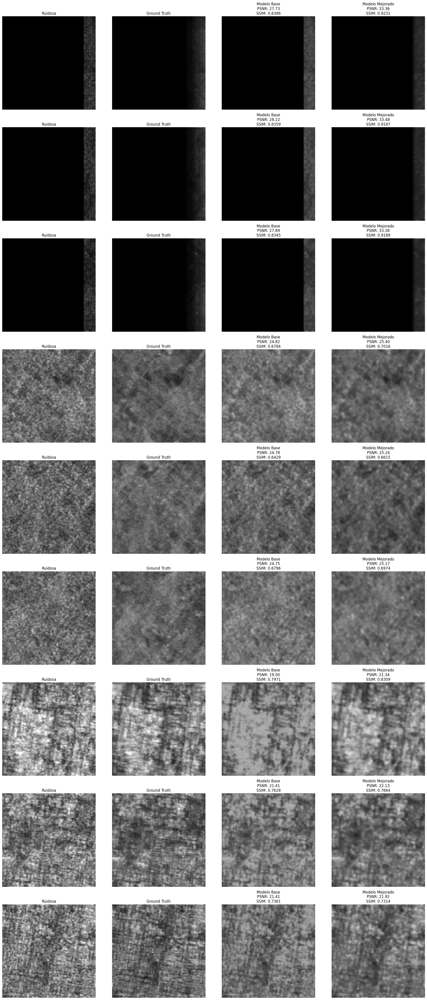

Métricas promedio para Modelo Base:
  PSNR: 24.4447
  SSIM: 0.7562
  ENL: 33.0321
  M-estimator: 1.1309
-----
Métricas promedio para Modelo Mejorado:
  PSNR: 26.8249
  SSIM: 0.7944
  ENL: 133.5862
  M-estimator: 1.1317
-----
Proceso completado. Los modelos han sido entrenados y evaluados.


In [ ]:
# Comparar rendimiento entre los dos modelos
def comparar_modelos(modelo1, modelo2, x_val, y_val, nombres=["Modelo Base", "Modelo Mejorado"], num_imagenes=9):
    """
    Compara el rendimiento de dos modelos
    """
    resultados = []

    for i, modelo in enumerate([modelo1, modelo2]):
        # Predecir con el modelo
        predicciones = modelo.predict(x_val[:num_imagenes])

        resultados_modelo = []

        for j in range(num_imagenes):
            # Imagen original con ruido
            img_ruidosa = x_val[j].reshape(img_height, img_width)

            # Imagen ground truth
            img_ground_truth = y_val[j].reshape(img_height, img_width)

            # Imagen filtrada
            img_filtrada = predicciones[j].reshape(img_height, img_width)

            # Calcular métricas
            psnr_valor = psnr(img_ground_truth, img_filtrada,data_range=1.0)
            ssim_valor = ssim(img_ground_truth, img_filtrada,data_range=1.0)
            enl_filtrada = calcular_enl(img_filtrada)
            m_estimator = calcular_m_estimator(img_ruidosa, img_filtrada)

            resultados_modelo.append({
                "psnr": psnr_valor,
                "ssim": ssim_valor,
                "enl": enl_filtrada,
                "m_estimator": m_estimator
            })

        resultados.append(resultados_modelo)

    # Mostrar comparación visual
    plt.figure(figsize=(20, 5 * num_imagenes))

    for i in range(num_imagenes):
        # Imagen original con ruido
        img_ruidosa = x_val[i].reshape(img_height, img_width)

        # Imagen ground truth
        img_ground_truth = y_val[i].reshape(img_height, img_width)

        # Imágenes filtradas con cada modelo
        img_filtrada1 = modelo1.predict(x_val[i:i+1])[0].reshape(img_height, img_width)
        img_filtrada2 = modelo2.predict(x_val[i:i+1])[0].reshape(img_height, img_width)

        plt.subplot(num_imagenes, 4, i*4 + 1)
        plt.imshow(img_ruidosa, cmap='gray')
        plt.title('Ruidosa')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 2)
        plt.imshow(img_ground_truth, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 3)
        plt.imshow(img_filtrada1, cmap='gray')
        plt.title(f'{nombres[0]}\nPSNR: {resultados[0][i]["psnr"]:.2f}\nSSIM: {resultados[0][i]["ssim"]:.4f}')
        plt.axis('off')

        plt.subplot(num_imagenes, 4, i*4 + 4)
        plt.imshow(img_filtrada2, cmap='gray')
        plt.title(f'{nombres[1]}\nPSNR: {resultados[1][i]["psnr"]:.2f}\nSSIM: {resultados[1][i]["ssim"]:.4f}')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('comparacion_modelos.png')
    plt.show()

    # Mostrar métricas promedio
    for i, nombre in enumerate(nombres):
        psnr_promedio = np.mean([res["psnr"] for res in resultados[i]])
        ssim_promedio = np.mean([res["ssim"] for res in resultados[i]])
        enl_promedio = np.mean([res["enl"] for res in resultados[i]])
        m_promedio = np.mean([res["m_estimator"] for res in resultados[i]])

        print(f"Métricas promedio para {nombre}:")
        print(f"  PSNR: {psnr_promedio:.4f}")
        print(f"  SSIM: {ssim_promedio:.4f}")
        print(f"  ENL: {enl_promedio:.4f}")
        print(f"  M-estimator: {m_promedio:.4f}")
        print("-----")
# Comparar los dos modelos
comparar_modelos(autoencoder, autoencoder_mejorado, x_val, y_val)

# Guardar los modelos entrenados
autoencoder.save('autoencoder_base.keras')
autoencoder_mejorado.save('autoencoder_mejorado.keras')

print("Proceso completado. Los modelos han sido entrenados y evaluados.")